In [308]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from itertools import combinations
from collections import defaultdict

In [309]:
data_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/Data/Raw_data/PUF AY %i/CSV/'
years = range(2017, 2023)
thoracotomy_codes = ['0WJB0ZZ', '0WJ90ZZ', '02JA0ZZ', '02JY0ZZ', '0BJL0ZZ', '0BJK0ZZ', '0BJQ0ZZ','0WJ80ZZ', '0WJC0ZZ', '0WJD0ZZ', '02VW0CZ', '02QA0ZZ', '3E080GC']
sternotomy_codes = ['0P800ZZ']
exclude_ed_disp = ['Not Applicable BIU 1', 'Not Known BIU 2', 'Not Known/Not Recorded BIU 2', 'Unknown', 'Not Recorded BIU 3']
exclude_hosp_disp = ['Not Applicable BIU 1', 'Not Known BIU 2', 'Not Known/Not Recorded BIU 2', 'Unknown', 'Not Recorded BIU 3']

mechanism_code_dict = {1:'Cut/pierce', 2:'Drowning/submersion', 3:'Fall', 4:'Fire/flame', 5:'Hot object/substance', 6:'Firearm', 7:'Machinery', 8:'MVT Occupant', 9:'MVT Motorcyclist', 10:'MVT Pedal cyclist', 11:'MVT Pedestrian', 12:'MVT Unspecified', 13:'MVT Other', 14:'Pedal cyclist, other', 15:'Pedestrian, other', 16:'Transport, other', 17:'Natural/environmental,  Bites and stings', 18:'Natural/environmental,  Other', 19:'Overexertion', 20:'Poisoning', 21:'Struck by, against', 22:'Suffocation', 23:'Other specified and classifiable', 24:'Other specified, not elsewhere classifiable', 25:'Unspecified', 26:'Adverse effects, medical care', 27:'Adverse effects, drugs'} # As noted in PUF dictionary
trauma_type_code_dict = {1:'Blunt', 2:'Penetrating', 3:'Burn', 4:'Other/unspecified', 9:'Activity Code - Not Valid as a Primary E-Code'} # As noted in PUF Dictionary
sex_code_dict = {1:'Male', 2:'Female'}
eddischarge_code_dict = {1: 'Floor bed (general admission, non-specialty unit bed)', 2: 'Observation unit (unit that provides < 24 hour stays)', 3: 'Telemetry/step-down unit (less acuity than ICU)', 4: 'Home with services', 5: 'Deceased/expired', 6: 'Other (jail, institutional care, mental health, etc.)', 7: 'Operating Room', 8: 'Intensive Care Unit (ICU)', 9: 'Home without services', 10: 'Left against medical advice', 11: 'Transferred to another hospital'}
hospdischarge_disposition_code_dict = {1: 'Discharged/Transferred to a short-term general hospital for inpatient care', 2: 'Discharged/Transferred to an Intermediate Care Facility (ICF)', 3: 'Discharged/Transferred to home under care of organized home health service', 4: 'Left against medical advice or discontinued care', 5: 'Deceased/Expired', 6: 'Discharged to home or self-care (routine discharge)', 7: 'Discharged/Transferred to Skilled Nursing Facility (SNF)', 8: 'Discharged/Transferred to hospice care', 10: 'Discharged/Transferred to court/law enforcement', 11: 'Discharged/Transferred to inpatient rehab or designated unit', 12: 'Discharged/Transferred to Long Term Care Hospital (LTCH)', 13: 'Discharged/Transferred to a psychiatric hospital or psychiatric distinct part unit of a hospital', 14: 'Discharged/Transferred to another type of institution not defined elsewhere'}

cols17 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols19 = pd.read_csv(data_fp%(2019)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols17 = [x.upper() for x in cols17]
cols19 = [x.upper() for x in cols19]

common_cols = list(set(cols17) & set(cols19))

# Data Exploration of Thoracotomy Data Population

## Combine years of data into one `DataFrame` for figure generation

In [310]:
for year in years:
    
    if year in range(2017, 2019):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    elif year in range(2019, 2023):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    else:
        pass
    
    TRAUMA_df.columns = map(str.upper, TRAUMA_df.columns)
    ICDPROCEDURE_df.columns = map(str.upper, ICDPROCEDURE_df.columns)
    ICDPROCEDURE_LOOKUP_df.columns = map(str.upper, ICDPROCEDURE_LOOKUP_df.columns)
    ECODE_LOOKUP_df.columns = map(str.upper, ECODE_LOOKUP_df.columns)

    if year in range(2019, 2023):
        ICDPROCEDURE_df['PROCEDUREMINS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTHRS']*60
        ICDPROCEDURE_df['PROCEDUREDAYS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTDAYS']
        TRAUMA_df['HMRRHGCTRLSURGMINS'] = TRAUMA_df['HMRRHGCTRLSURGHRS']*60
    else:
        pass
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[:, ['INC_KEY', 'ICDPROCEDURECODE', 'PROCEDUREMINS', 'PROCEDUREDAYS']]
    
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'HMRRHGCTRLSURGMINS'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['HMRRHGCTRLSURGTYPE'] == 3.0]
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['INC_KEY'].isin(np.unique(TRAUMA_df['INC_KEY']))]
    
    procedure_dict = dict(zip(ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE'], ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE_DESC'])) # create dictionary
    ICDPROCEDURE_df['ICDPROCEDURECODE'] = ICDPROCEDURE_df['ICDPROCEDURECODE'].replace(procedure_dict) # implement dictionary
    
    ecode_dict = dict(zip(ECODE_LOOKUP_df['ECODE'], ECODE_LOOKUP_df['ECODE_DESC'])) # create dictionary
    TRAUMA_df['PRIMARYECODEICD10'] = TRAUMA_df['PRIMARYECODEICD10'].replace(ecode_dict) # implement dictionary
    
    mechanism_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['MECHANISM'])) # create dictionary
    TRAUMA_df['MECHANISM'] = TRAUMA_df['PRIMARYECODEICD10'].map(mechanism_dict) # implement dictionary
    
    traumatype_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['TRAUMATYPE'])) # create dictionary
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['PRIMARYECODEICD10'].map(traumatype_dict) # implement dictionary
    
    TRAUMA_df['MECHANISM'] = TRAUMA_df['MECHANISM'].replace(mechanism_code_dict) # implement dictionary
    
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['TRAUMATYPE'].replace(trauma_type_code_dict) # implement dictionary
    
    TRAUMA_df['SEX'] = TRAUMA_df['SEX'].replace(sex_code_dict)
    
    TRAUMA_df['EDDISCHARGEDISPOSITION'] = TRAUMA_df['EDDISCHARGEDISPOSITION'].replace(eddischarge_code_dict) # implement dictionary
    
    TRAUMA_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_df['HOSPDISCHARGEDISPOSITION'].replace(hospdischarge_disposition_code_dict) # implement dictionary
    
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['TRAUMATYPE'].isin(['Blunt', 'Penetrating'])]
    
    TRAUMA_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newTRAUMA_df_%i.csv'%year, index=False)
    ICDPROCEDURE_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newICDPROCEDURE_df_%i.csv'%year, index=False)
          
    display(ICDPROCEDURE_df.head())
    display(TRAUMA_df.head())

,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1050,170002937445,"Insertion of Endotracheal Airway into Trachea,...",8.0,1.0
4010,170000021215,Drainage of Right Pleural Cavity with Drainage...,NaN,NaN
4011,170000021215,Drainage of Left Pleural Cavity with Drainage ...,NaN,NaN
4012,170000021215,"Drainage of Right Inguinal Region, Open Approach",NaN,NaN
4013,170000021215,"Performance of Cardiac Output, Continuous",NaN,NaN


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
251,NaN,1.0,2.0,NaN,NaN,1.0,33.0,0,0,0,...,103.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
835,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,91.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Cut/pierce,Penetrating
1412,NaN,1.0,2.0,NaN,NaN,1.0,31.0,0,1,0,...,59.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
1489,NaN,1.0,2.0,NaN,W74.XXXA,NaN,24.0,0,1,0,...,70.0,NaN,0,NaN,NaN,2.0,2.0,NaN,Firearm,Penetrating
1825,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,100.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2363,180023610118,Ultrasonography of Abdomen,0.0,1.0
2364,180023610118,"Insertion of Endotracheal Airway into Trachea,...",6.0,1.0
2366,180023610118,Drainage of Right Pleural Cavity with Drainage...,10.0,1.0
2367,180023610118,"Inspection of Right Pleural Cavity, Open Approach",29.0,1.0
2368,180023610118,"Repair Heart, Open Approach",29.0,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
301,NaN,1.0,2.0,NaN,NaN,1.0,20.0,0,1,0,...,123.0,NaN,1,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
1819,NaN,1.0,2.0,NaN,Y07.04,NaN,27.0,0,1,0,...,86.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Cut/pierce,Penetrating
2118,NaN,1.0,2.0,NaN,NaN,1.0,35.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
3020,NaN,1.0,2.0,NaN,NaN,1.0,22.0,0,1,0,...,73.0,NaN,1,2.0,NaN,NaN,2.0,NaN,Cut/pierce,Penetrating
3257,NaN,1.0,2.0,NaN,NaN,1.0,71.0,0,1,0,...,NaN,2.0,1,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1181,190027760890,Plain Radiography of Chest,1.8,1.0
1309,190027760890,Computerized Tomography (CT Scan) of Facial Bones,24.0,1.0
1311,190027760890,Ultrasonography of Abdomen,4.2,1.0
1313,190027760890,Insertion of Infusion Device into Right Radial...,49.8,1.0
1316,190027760890,Drainage of Right Pleural Cavity with Drainage...,64.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
156,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
173,NaN,1.0,2.0,NaN,NaN,1.0,29.0,0,1,0,...,81.7,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
192,NaN,1.0,2.0,NaN,NaN,1.0,60.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Cut/pierce,Penetrating
1042,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,73.4,NaN,1,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
3316,NaN,1.0,2.0,NaN,NaN,1.0,26.0,0,1,0,...,92.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Cut/pierce,Penetrating


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2551,200042924891,NaN,NaN,NaN
10107,200043189429,Insertion of Monitoring Device into Upper Arte...,22.2,1.0
10108,200043189429,Insertion of Infusion Device into Right Subcla...,1561.2,2.0
10109,200043189429,"Excision of Left Lung, Open Approach",343.8,1.0
10110,200043189429,"Insertion of Endotracheal Airway into Trachea,...",142.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
504,NaN,NaN,NaN,NaN,NaN,NaN,23.0,0,1,0,...,100.0,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
1459,NaN,NaN,NaN,NaN,NaN,NaN,89.0,1,0,0,...,80.0,NaN,1,2.0,NaN,NaN,2.0,NaN,MVT Occupant,Blunt
2010,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
3111,NaN,NaN,NaN,NaN,NaN,NaN,31.0,0,1,0,...,90.7,NaN,0,2.0,NaN,NaN,2.0,NaN,MVT Motorcyclist,Blunt
3214,NaN,NaN,NaN,NaN,NaN,NaN,37.0,0,0,0,...,NaN,2.0,1,2.0,NaN,NaN,2.0,NaN,MVT Occupant,Blunt


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
3282,210057699044,"Restriction of Thoracic Aorta, Descending with...",771.0,2.0
3283,210057699044,Insertion of Intraluminal Device into Right Ra...,625.8,2.0
3284,210057699044,"Repair Right Upper Eyelid, External Approach",NaN,2.0
3285,210057699044,"Repair Face Skin, External Approach",NaN,2.0
3286,210057699044,"Repair Face Skin, External Approach",NaN,2.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
414,NaN,NaN,NaN,NaN,NaN,NaN,21.0,0,1,0,...,110.0,NaN,1,2.0,NaN,NaN,2.0,NaN,MVT Occupant,Blunt
562,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Other specified and classifiable,Blunt
1243,NaN,NaN,NaN,NaN,NaN,NaN,20.0,0,0,0,...,NaN,2.0,1,2.0,NaN,NaN,2.0,NaN,MVT Occupant,Blunt
1695,NaN,NaN,NaN,NaN,NaN,NaN,29.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
1714,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,NaN,2.0,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
4686,220063640246,"Insertion of Endotracheal Airway into Trachea,...",3.0,1.0
4687,220063640246,Drainage of Right Pleural Cavity with Drainage...,4.2,1.0
4688,220063640246,Drainage of Left Pleural Cavity with Drainage ...,4.8,1.0
4689,220063640246,"Inspection of Right Pleural Cavity, Open Approach",4.8,1.0
4690,220063640246,"Inspection of Left Pleural Cavity, Open Approach",4.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WEIGHT,WEIGHT_BIU,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,MECHANISM,TRAUMATYPE
736,NaN,NaN,NaN,NaN,NaN,NaN,58.0,0,1,0,...,85.00,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
783,NaN,NaN,NaN,NaN,NaN,NaN,79.0,0,1,0,...,68.04,NaN,1,2.0,NaN,NaN,2.0,NaN,MVT Pedestrian,Blunt
1392,NaN,NaN,NaN,NaN,NaN,NaN,76.0,0,0,0,...,90.70,NaN,1,2.0,NaN,NaN,2.0,NaN,MVT Occupant,Blunt
1685,NaN,NaN,NaN,NaN,NaN,NaN,27.0,0,0,0,...,113.00,NaN,1,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating
1752,NaN,NaN,NaN,NaN,NaN,NaN,22.0,0,1,0,...,115.00,NaN,0,2.0,NaN,NaN,2.0,NaN,Firearm,Penetrating


In [312]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newICDPROCEDURE_df_%i.csv'

years = range(2007, 2023)

TRAUMA_cols17 = pd.read_csv(TRAUMA_fp%2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols17 = pd.read_csv(ICDPROCEDURE_fp%2017, nrows=1).columns.tolist()
TRAUMA_cols07 = pd.read_csv(TRAUMA_fp%2007, nrows=1).columns.tolist()
ICDPROCEDURE_cols07 = pd.read_csv(ICDPROCEDURE_fp%2007, nrows=1).columns.tolist()

TRAUMA_cols = list(set(TRAUMA_cols07) & set(TRAUMA_cols17))
ICDPROCEDURE_cols = list(set(ICDPROCEDURE_cols07) & set(ICDPROCEDURE_cols17)).append('Year')

TRAUMA_all_df = pd.DataFrame(columns=TRAUMA_cols)
ICDPROCEDURE_all_df = pd.DataFrame(columns=ICDPROCEDURE_cols)

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp%year, usecols=TRAUMA_cols)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp%year, usecols=ICDPROCEDURE_cols)
    icdprocedure_df['Year'] = year
    TRAUMA_all_df = pd.concat([TRAUMA_all_df, trauma_df], ignore_index=True)
    ICDPROCEDURE_all_df = pd.concat([ICDPROCEDURE_all_df, icdprocedure_df], ignore_index=True)

TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].fillna('Unknown')
TRAUMA_all_df['EDDISCHARGEDISPOSITION'] = TRAUMA_all_df['EDDISCHARGEDISPOSITION'].fillna('Unknown')
TRAUMA_all_df['SEX'] = TRAUMA_all_df['SEX'].replace({'3.0': 'Unknown', 'Not Known BIU 2': 'Unknown', 'Not Known/Not Recorded BIU 2': 'Unknown', 'Unknown': 'Unknown'})
TRAUMA_all_df = TRAUMA_all_df.loc[~TRAUMA_all_df['EDDISCHARGEDISPOSITION'].isin(exclude_ed_disp)]
TRAUMA_all_df = TRAUMA_all_df.loc[~TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].isin(exclude_hosp_disp)]

display(TRAUMA_all_df)
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df)
print(np.shape(ICDPROCEDURE_all_df))

/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



,AGEYEARS,EDDISCHARGEDISPOSITION,HMRRHGCTRLSURGDAYS,HMRRHGCTRLSURGMINS,HMRRHGCTRLSURGTYPE,HOSPDISCHARGEDISPOSITION,INC_KEY,MECHANISM,PRIMARYECODEICD10,SEX,TRAUMATYPE,Year
1,78,Operating Room,NaN,NaN,NaN,Expired,839,Fall,Oth and Unspec Fall - Unspec,Male,Blunt,2007.0
2,20,Operating Room,NaN,NaN,NaN,Expired,943,MVT Occupant,"MVA Traffic, Loss Control-No Collision - Drive...",Male,Blunt,2007.0
3,51,Intensive Care Unit (ICU),NaN,NaN,NaN,Expired,1013,MVT Occupant,"Oth MVA Traffic, Collision w/ MV - Driver of M...",Female,Blunt,2007.0
4,21,Operating Room,NaN,NaN,NaN,Discharged home with no home services,1088,Cut/pierce,Assault by Cutting and Piercing Instrument,Male,Penetrating,2007.0
5,22,Operating Room,NaN,NaN,NaN,Expired,1237,MVT Occupant,"Oth MVA Traffic, Collision w/ MV - Driver of M...",Male,Blunt,2007.0
6,22,Died,NaN,NaN,NaN,Expired,1455,Firearm,Assault by Firearms/Explosives - Oth and Unspe...,Male,Penetrating,2007.0
7,18,Operating Room,NaN,NaN,NaN,Expired,1870,MVT Occupant,"Oth MVA Traffic, Collision w/ MV - Passenger i...",Female,Blunt,2007.0
8,41,Operating Room,NaN,NaN,NaN,Discharged home with no home services,1964,MVT Occupant,"MVA Traffic, Loss Control-No Collision - Drive...",Male,Blunt,2007.0
9,41,Died,NaN,NaN,NaN,Expired,2283,MVT Occupant,"MVA Traffic, Loss Control-No Collision - Drive...",Male,Blunt,2007.0
10,48,Died,NaN,NaN,NaN,Expired,2288,MVT Occupant,"MVA Traffic, Loss Control-No Collision - Drive...",Male,Blunt,2007.0


(28195, 12)


,HOURTOPRO,ICDPROCEDURECODE,INC_KEY,PROCEDUREDAYS,PROCEDUREMINS,Year
0,3.0,Insertion of intercostal catheter for drainage,402,1.0,180.0,2007
1,3.0,Insertion of endotracheal tube,402,1.0,180.0,2007
2,3.0,Exploratory thoracotomy,402,1.0,180.0,2007
3,10.0,Other miscellaneous procedures,402,1.0,600.0,2007
4,3.0,Other repair of diaphragm,402,1.0,180.0,2007
5,3.0,Closure of laceration of liver,402,1.0,180.0,2007
6,3.0,"Excision of bone for graft, other",402,1.0,180.0,2007
7,3.0,"Bone graft, humerus",402,1.0,180.0,2007
8,-1.0,Arterial catheterization,839,2.0,-60.0,2007
9,-1.0,Not Known BIU 2,839,-1.0,-60.0,2007


(586433, 6)


# Age Demographics

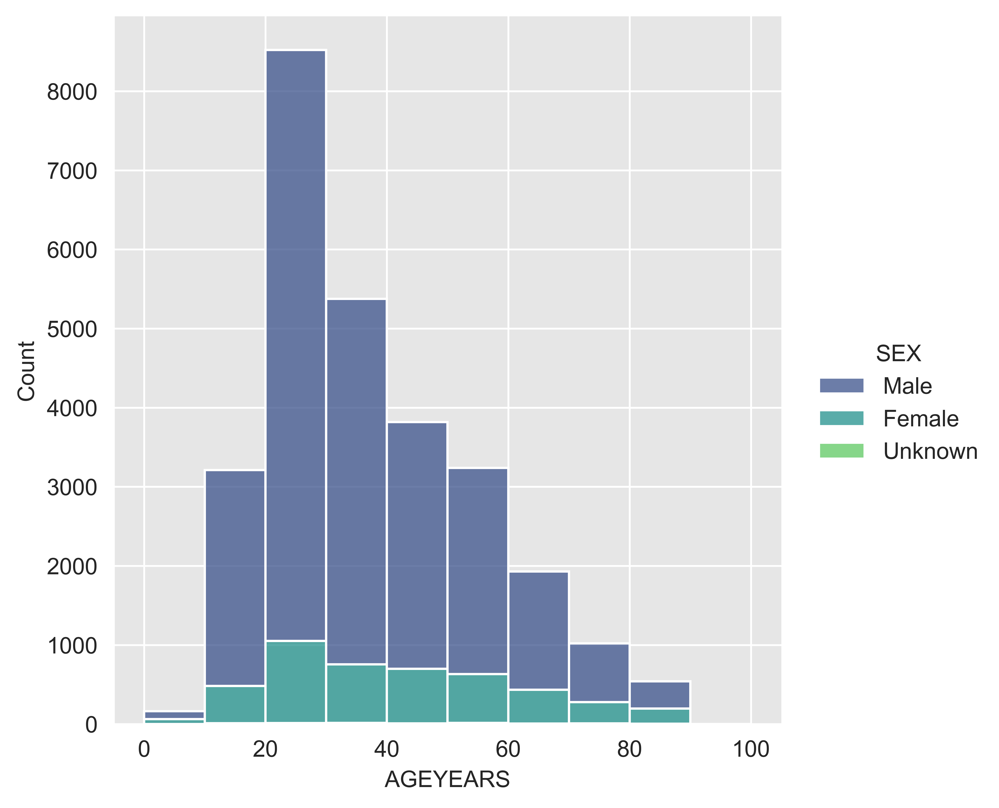

In [313]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='SEX',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

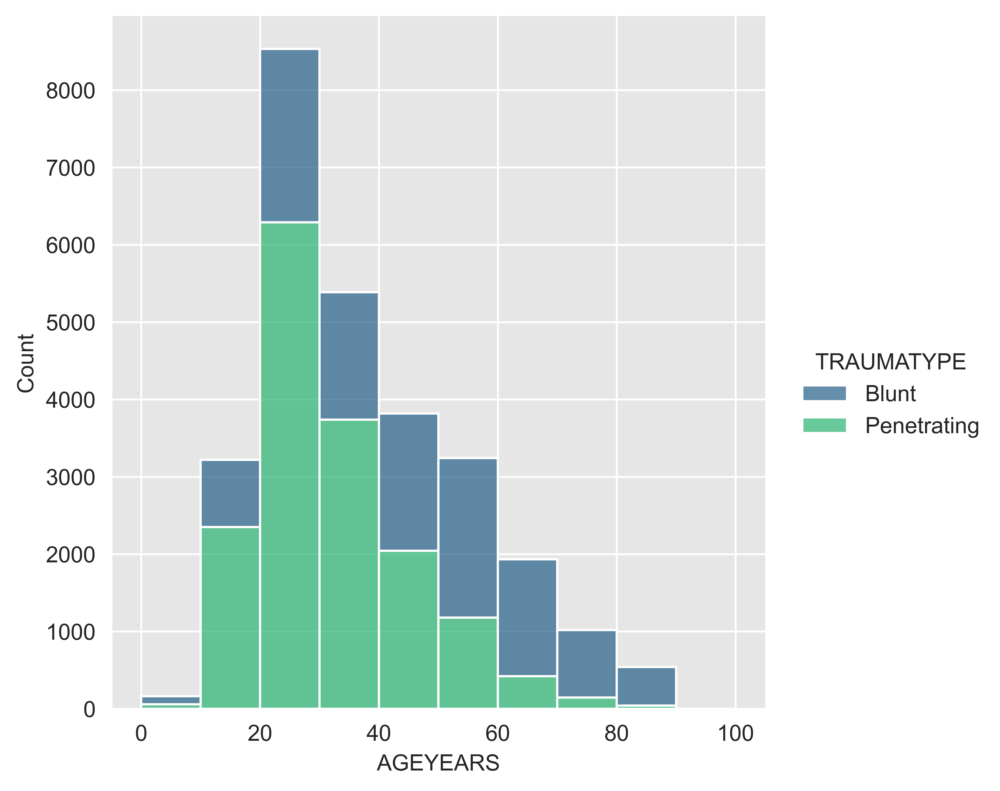

In [314]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='TRAUMATYPE',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

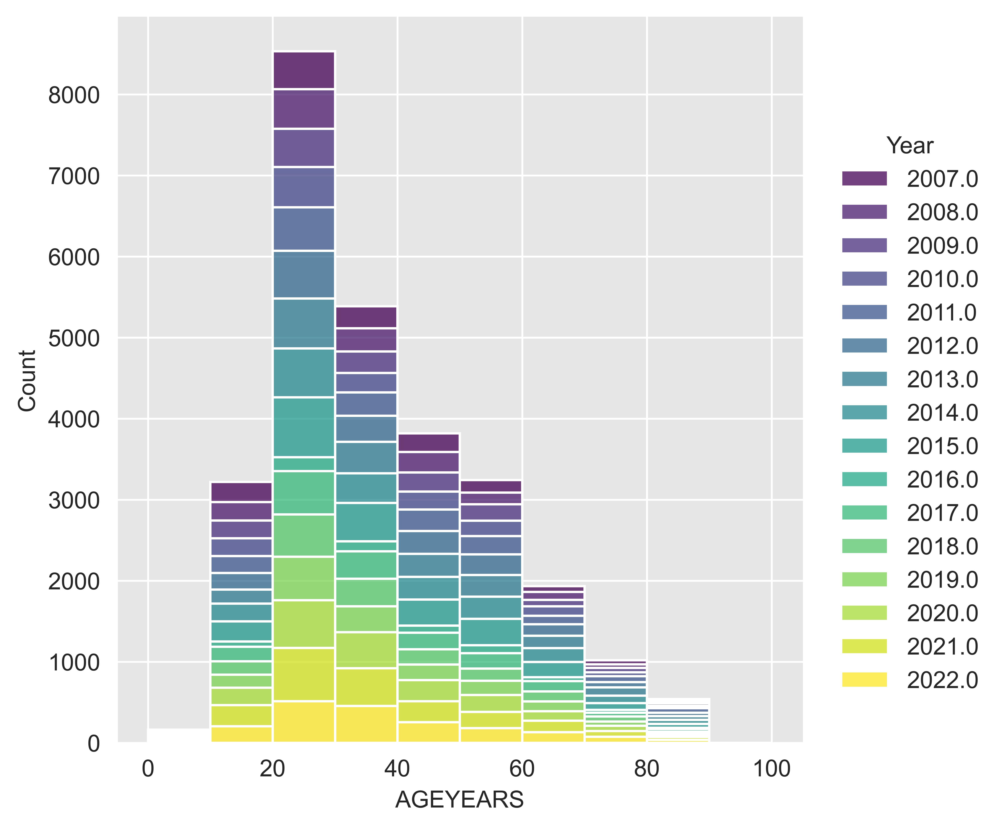

In [315]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='Year',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

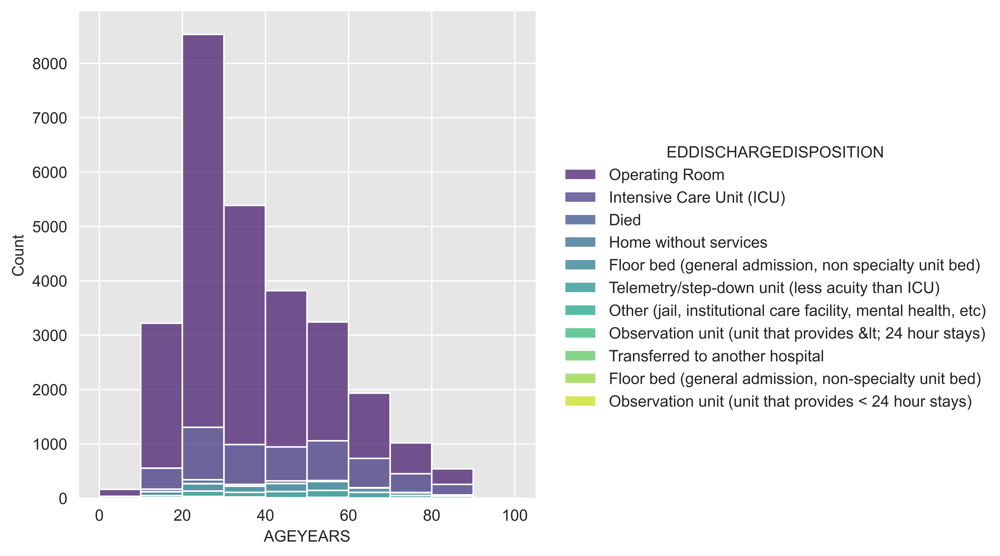

In [316]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='EDDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

In [317]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='HOSPDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

# Data about ICD Procedures (Includes **ALL** Procedures, not just the thoracomies but is only using thoracotomy patients)

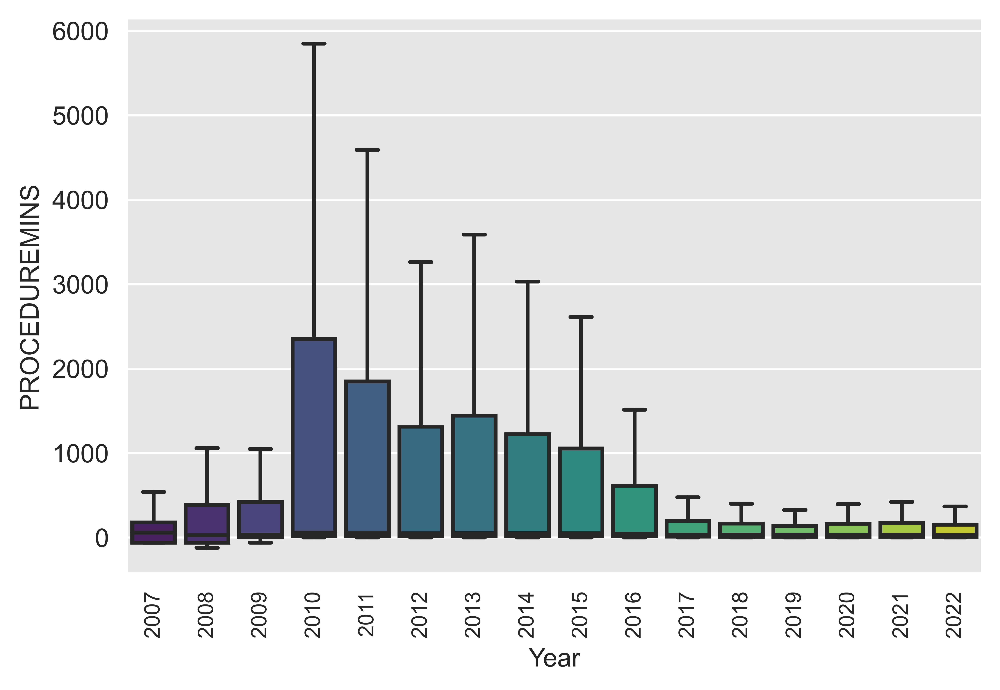

In [318]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=False,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

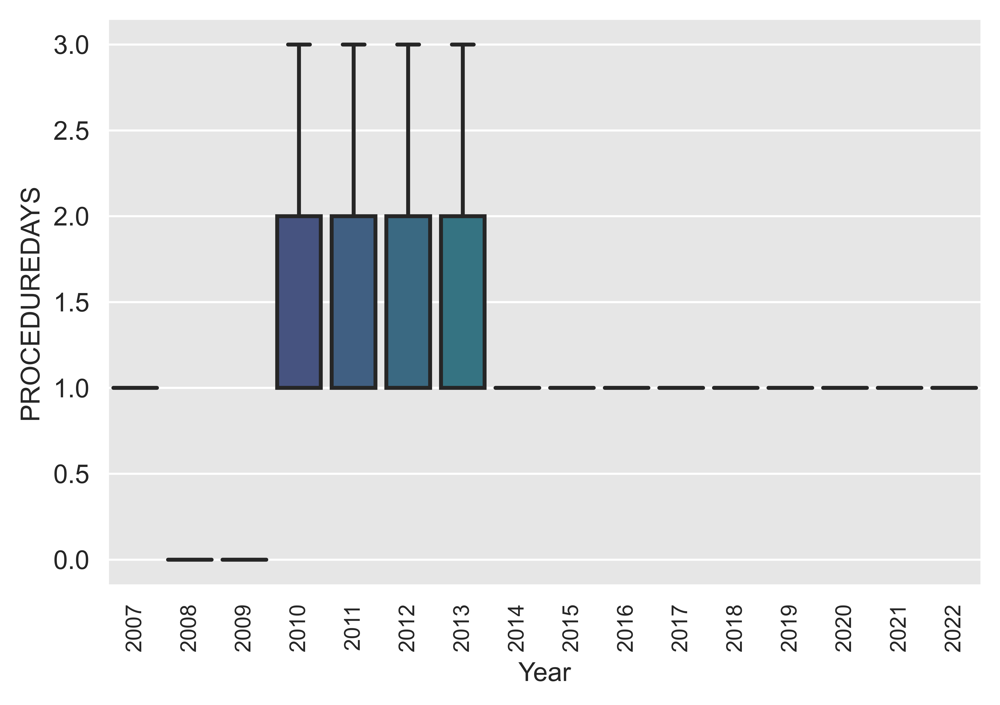

In [319]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=False,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

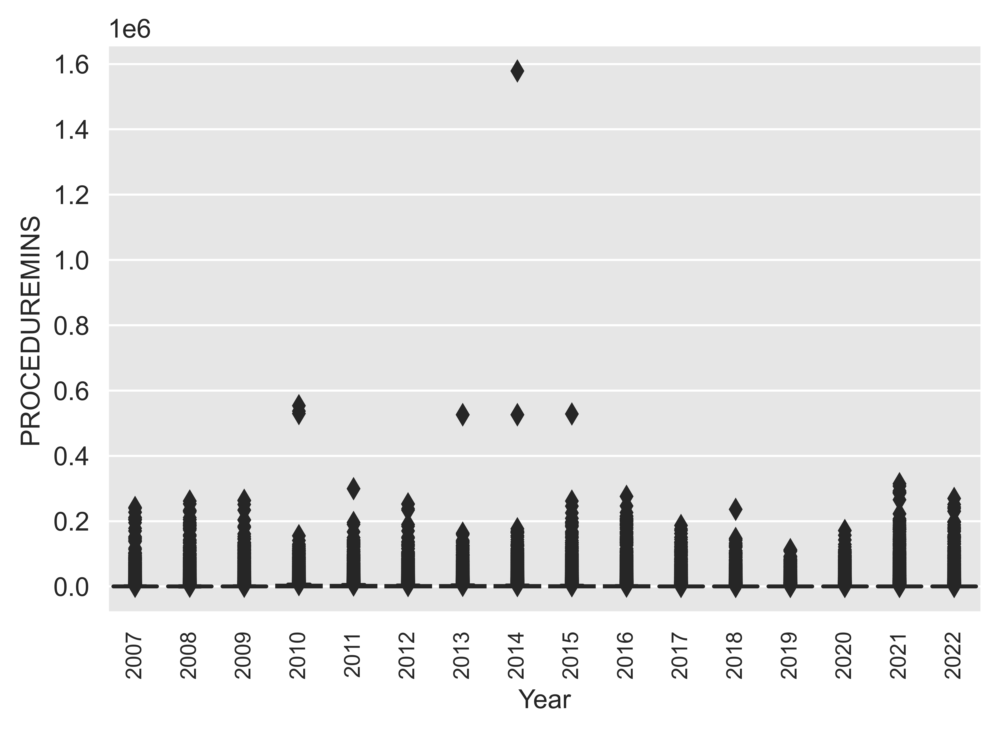

In [296]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=True,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

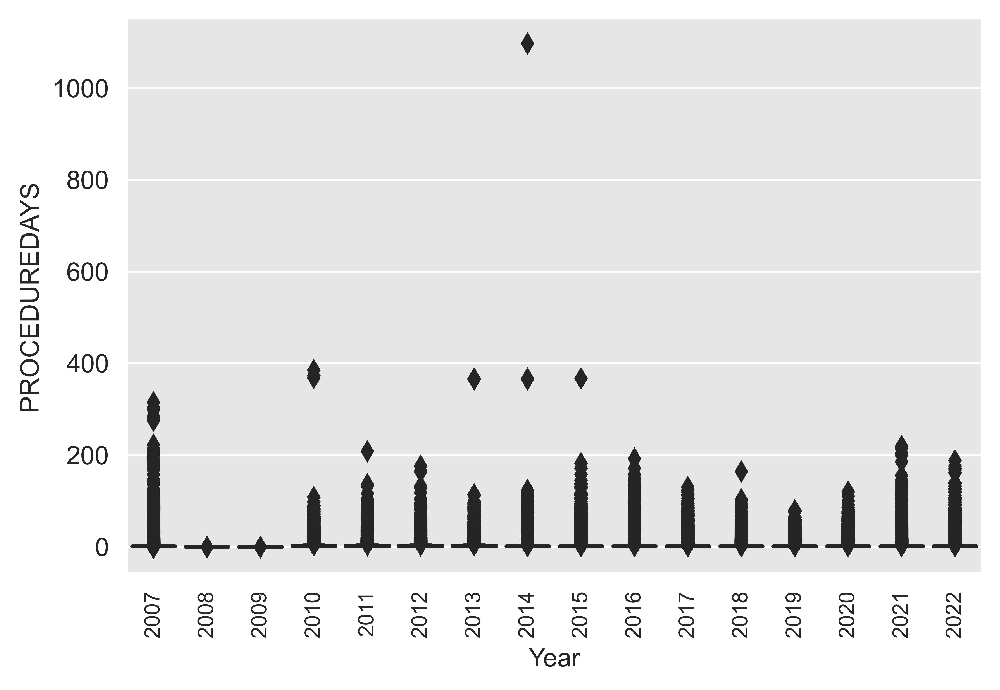

In [297]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

# Timing of Thoracotomy According to New Data Field

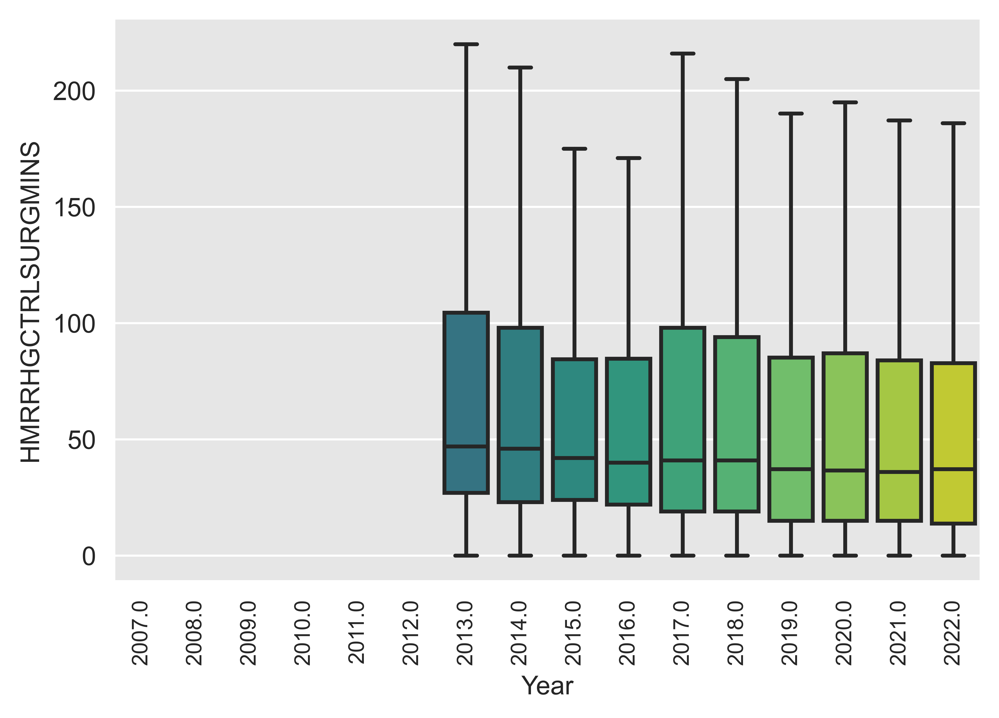

In [298]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGMINS',
               x='Year',
               showfliers=False,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

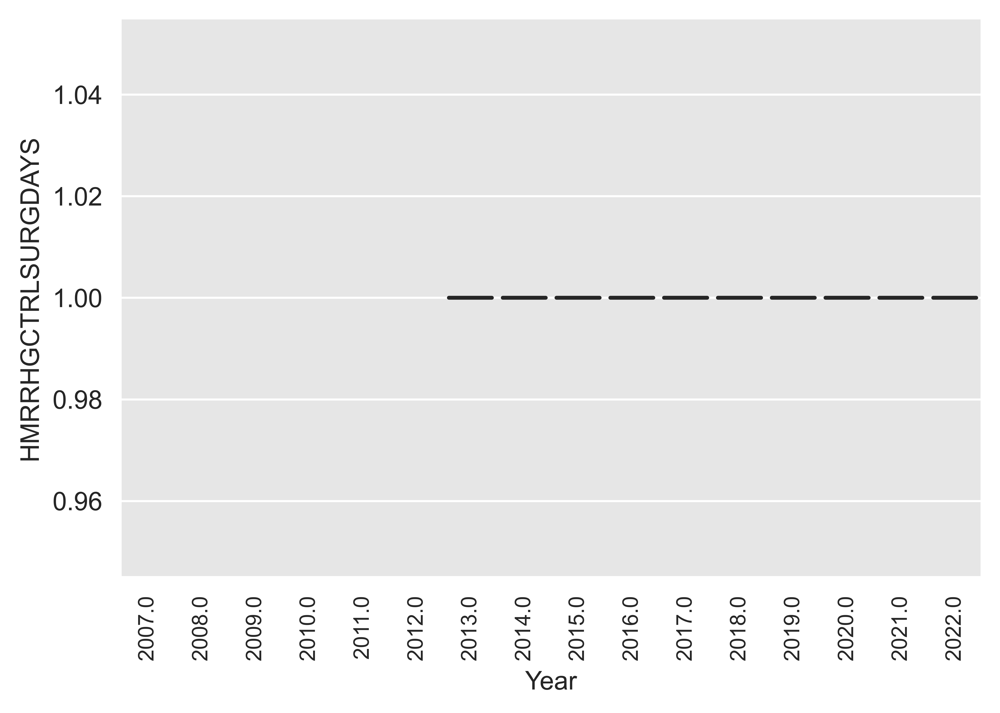

In [299]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGDAYS',
               x='Year',
               showfliers=False,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

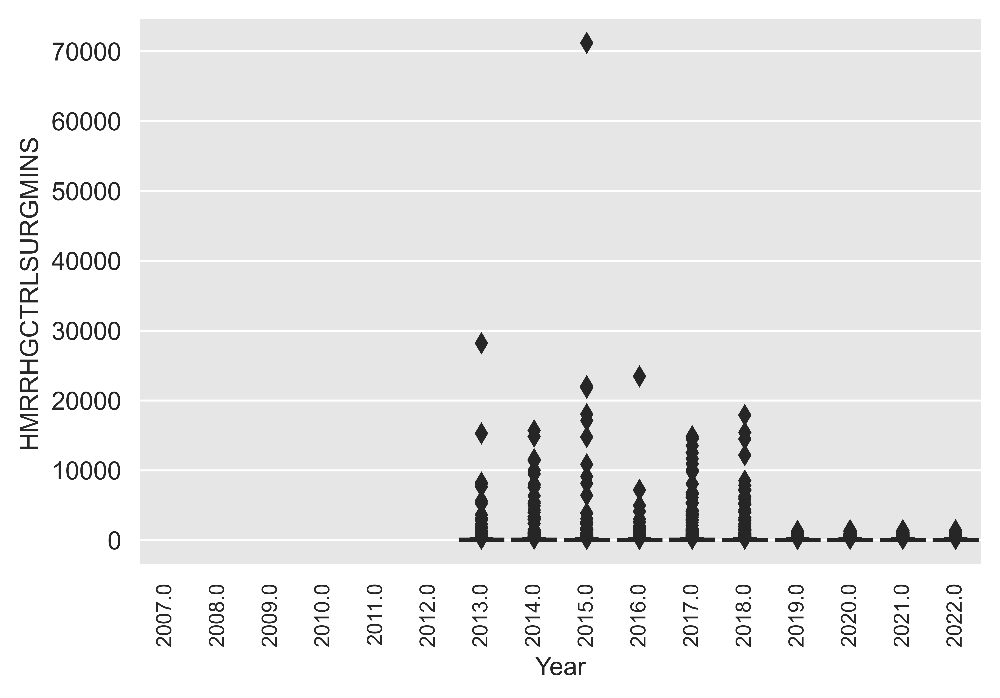

In [300]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGMINS',
               x='Year',
               showfliers=True,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

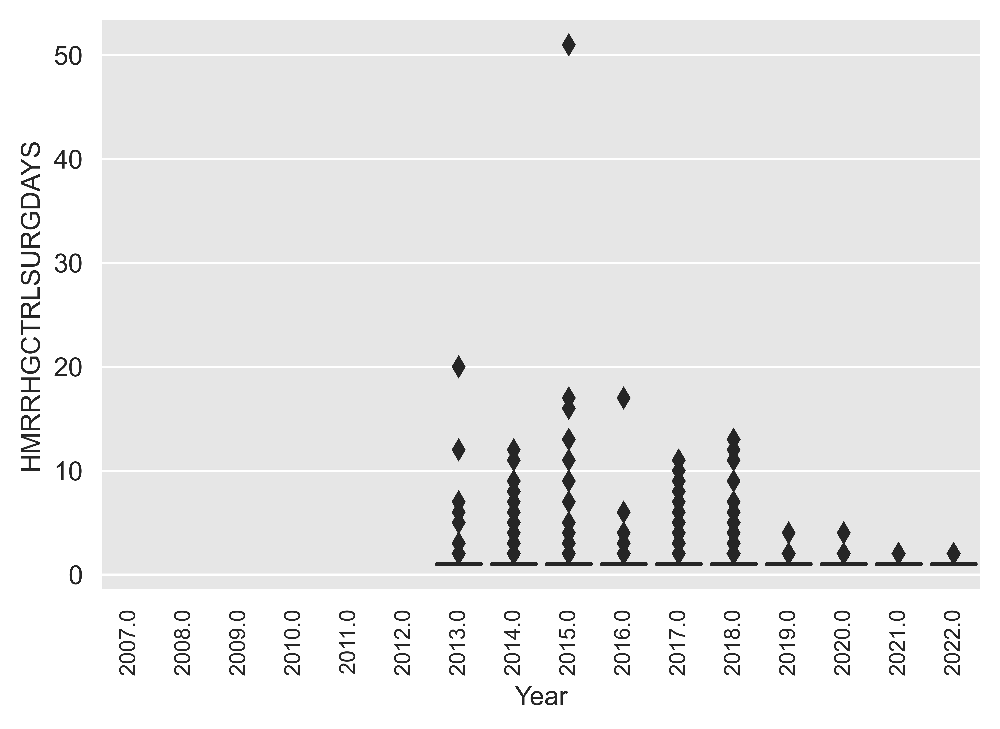

In [301]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

# Create Mortality Statistics
## Create `DataFrame` of Mortality by `Year` and `Mechanism`

In [331]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
years = range(2017, 2023)

# Filter ICDPROCEDURE_all_df to include only 'Exploratory thoracotomy'
icd_filtered_df = ICDPROCEDURE_all_df[ICDPROCEDURE_all_df['ICDPROCEDURECODE'] == 'Exploratory thoracotomy']

# Get the row with the minimum PROCEDUREMINS for each INC_KEY
icd_filtered_df = icd_filtered_df.loc[icd_filtered_df.groupby('INC_KEY')['PROCEDUREMINS'].idxmin()]

# Merge TRAUMA_all_df with the filtered ICDPROCEDURE_all_df on INC_KEY to include PROCEDUREMINS
merged_df = pd.merge(TRAUMA_all_df, icd_filtered_df[['INC_KEY', 'PROCEDUREMINS']], on='INC_KEY', how='left')

for year in years:
    year_df = merged_df[merged_df['Year'] == year]
    
    if year <= 2012:
        # Filter for traumas that happened in 20 minutes or less for PROCEDUREMINS
        time_filtered_df = year_df[year_df['PROCEDUREMINS'] <= 20]
    else:
        # Filter for traumas that happened in 20 minutes or less for HMRRHGCTRLSURGMINS and PROCEDUREMINS
        time_filtered_df = year_df[
            (year_df['HMRRHGCTRLSURGMINS'] <= 20) | 
            (year_df['PROCEDUREMINS'] <= 20) |
            ((year_df['HMRRHGCTRLSURGTYPE'] == 3.0) & (year_df['HMRRHGCTRLSURGMINS'] <= 20))
        ]
    
    # Penetrating trauma
    penetrating_df = time_filtered_df.loc[time_filtered_df['TRAUMATYPE'] == 'Penetrating']
    expired_pen_df = penetrating_df[
        penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired']) | 
        penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired'])
    ]
    mortality_pen_p = (len(expired_pen_df) / len(penetrating_df)) * 100 if len(penetrating_df) > 0 else 0
    
    # Blunt trauma
    blunt_df = time_filtered_df.loc[time_filtered_df['TRAUMATYPE'] == 'Blunt']
    expired_blunt_df = blunt_df[
        blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired']) | 
        blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired'])
    ]
    mortality_blunt_p = (len(expired_blunt_df) / len(blunt_df)) * 100 if len(blunt_df) > 0 else 0
    
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', len(penetrating_df)]], columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', len(blunt_df)]], columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
    combined_df = pd.concat([final_pen_df, final_blunt_df])
    
    mortality_year_table = pd.concat([mortality_year_table, combined_df])

mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table)


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  


,Year,Mortality %,MOI,EDTs Performed
0,2017,72.000000,Penetrating,300
0,2017,86.111111,Blunt,144
0,2018,80.743243,Penetrating,296
0,2018,83.941606,Blunt,137
0,2019,74.050633,Penetrating,316
0,2019,87.790698,Blunt,172
0,2020,76.470588,Penetrating,425
0,2020,85.029940,Blunt,167
0,2021,73.508353,Penetrating,419
0,2021,85.648148,Blunt,216


## Plot Year vs. Mortality

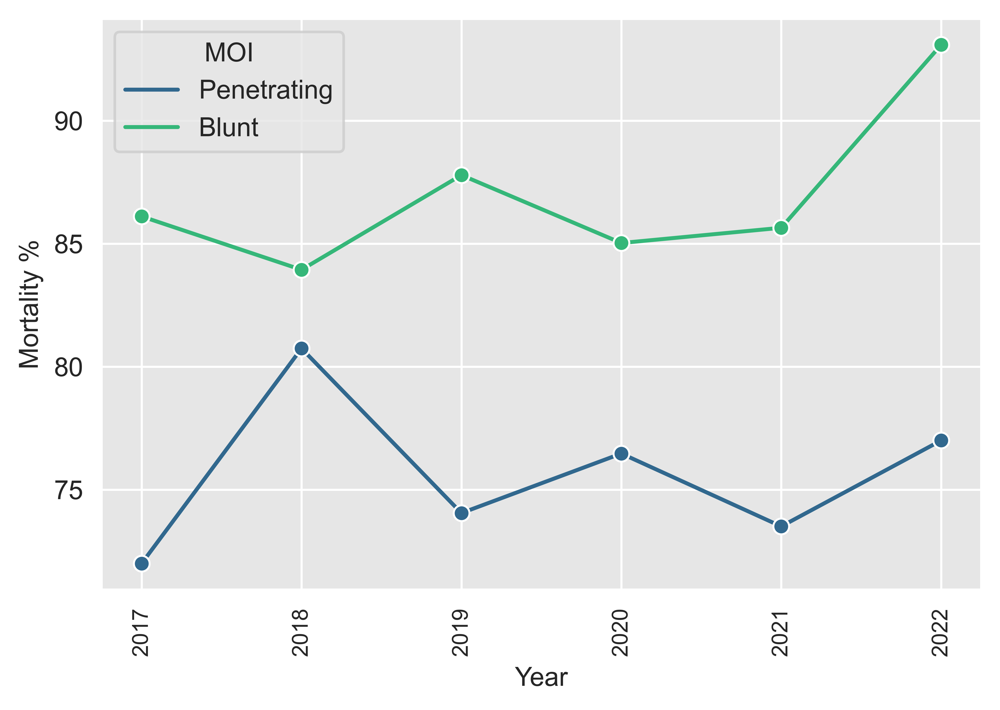

In [332]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis',
               marker='o')
tick_labels = np.arange(mortality_year_table['Year'].min(), mortality_year_table['Year'].max() + 1)
g.set_xticks(tick_labels)
g.set_xticklabels(tick_labels.astype(int))
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

> Obviously this is quite low mortality rate for what we expect. When you piece this graph together with the `boxplots` above it is clear that there are `damage control surgery` procedures called `thoracotomy` taking place outside of the 20 minute window. This makes it unlikely that they are true EDT. Therefore, below we will recreate the above figure but filter out the thoracotomies that took place outside of the initial 20 minute window from arrival at the ED, as was also done in the figures generated by my filtering method that does not use the `HMRRHGCTRLSURG....` data fields

In [326]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
years = range(2017, 2023)

# Filter ICDPROCEDURE_all_df to include only 'Exploratory thoracotomy'
icd_filtered_df = ICDPROCEDURE_all_df[ICDPROCEDURE_all_df['ICDPROCEDURECODE'] == 'Exploratory thoracotomy']

# Get the row with the minimum PROCEDUREMINS for each INC_KEY
icd_filtered_df = icd_filtered_df.loc[icd_filtered_df.groupby('INC_KEY')['PROCEDUREMINS'].idxmin()]

# Merge TRAUMA_all_df with the filtered ICDPROCEDURE_all_df on INC_KEY to include PROCEDUREMINS
merged_df = pd.merge(TRAUMA_all_df, icd_filtered_df[['INC_KEY', 'PROCEDUREMINS']], on='INC_KEY', how='left')

for year in years:
    year_df = merged_df[merged_df['Year'] == year]
    
    # Filter for traumas that happened in 20 minutes or less
    time_filtered_df = year_df[
        (year_df['HMRRHGCTRLSURGMINS'] <= 20) | 
        (year_df['PROCEDUREMINS'] <= 20)
    ]
    
    # Penetrating trauma
    penetrating_df = time_filtered_df.loc[time_filtered_df['TRAUMATYPE'] == 'Penetrating']
    expired_pen_df = penetrating_df[
        penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired']) | 
        penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired'])
    ]
    mortality_pen_p = (len(expired_pen_df) / len(penetrating_df)) * 100 if len(penetrating_df) > 0 else 0
    
    # Blunt trauma
    blunt_df = time_filtered_df.loc[time_filtered_df['TRAUMATYPE'] == 'Blunt']
    expired_blunt_df = blunt_df[
        blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired']) | 
        blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/Expired'])
    ]
    mortality_blunt_p = (len(expired_blunt_df) / len(blunt_df)) * 100 if len(blunt_df) > 0 else 0
    
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', len(penetrating_df)]], columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', len(blunt_df)]], columns=['Year', 'Mortality %', 'MOI', 'EDTs Performed'])
    combined_df = pd.concat([final_pen_df, final_blunt_df])
    
    mortality_year_table = pd.concat([mortality_year_table, combined_df])

mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table)


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  


,Year,Mortality %,MOI,EDTs Performed
0,2017,72.000000,Penetrating,300
0,2017,86.111111,Blunt,144
0,2018,80.743243,Penetrating,296
0,2018,83.941606,Blunt,137
0,2019,74.050633,Penetrating,316
0,2019,87.790698,Blunt,172
0,2020,76.470588,Penetrating,425
0,2020,85.029940,Blunt,167
0,2021,73.508353,Penetrating,419
0,2021,85.648148,Blunt,216


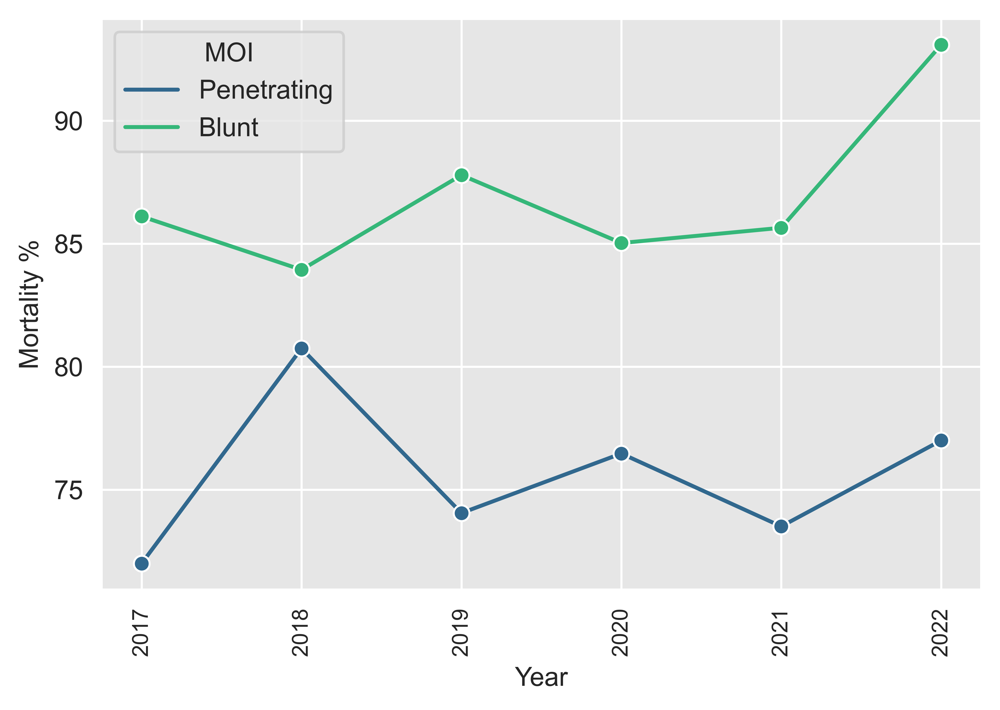

In [327]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis',
               marker='o')
tick_labels = np.arange(mortality_year_table['Year'].min(), mortality_year_table['Year'].max() + 1)
g.set_xticks(tick_labels)
g.set_xticklabels(tick_labels.astype(int))
g.tick_params(axis='x', rotation=90, labelsize='small')
plt.show()

## Create `DataFrame` of Mortality by `Age` and `Trauma Type`

In [270]:
mortality_age_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)

for age_range in age_ranges:
    icd_filter = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['ICDPROCEDURECODE'] == 'Exploratory thoracotomy']
    age_range_df = TRAUMA_all_df.loc[(TRAUMA_all_df['INC_KEY'].isin(np.unique(icd_filter['INC_KEY'])) | (TRAUMA_all_df['HMRRHGCTRLSURGTYPE'] == 3.0))]
    age_range_df = age_range_df[(age_range_df['AGEYEARS'] > age_range+1) & (age_range_df['AGEYEARS'] <= age_range+10)]
    penetrating_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Penetrating'])]
    if np.shape(penetrating_df)[0] == 0:
        continue
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired', 'Died', 'Died/ Expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Blunt'])]
    if np.shape(blunt_df)[0] == 0:
        continue
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_blunt_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
    mortality_age_table = pd.concat([mortality_age_table, combined_df])
mortality_age_table['Mortality %'] = mortality_age_table['Mortality %'].astype(float)
mortality_age_table['Age Range'] = mortality_age_table['Age Range'].astype(str)
display(mortality_age_table)

,Mortality %,Trauma Type,Age Range,# of Cases
0,49.606299,Penetrating,1 - 10,127
1,58.895706,Blunt,1 - 10,163
0,48.348544,Penetrating,11 - 20,4602
1,60.424028,Blunt,11 - 20,1415
0,50.439990,Penetrating,21 - 30,8182
1,60.901429,Blunt,21 - 30,2729
0,52.679362,Penetrating,31 - 40,4516
1,58.395990,Blunt,31 - 40,1995
0,50.789266,Penetrating,41 - 50,2534
1,50.982226,Blunt,41 - 50,2138


## Plot Age vs. Mortality `Barplot`

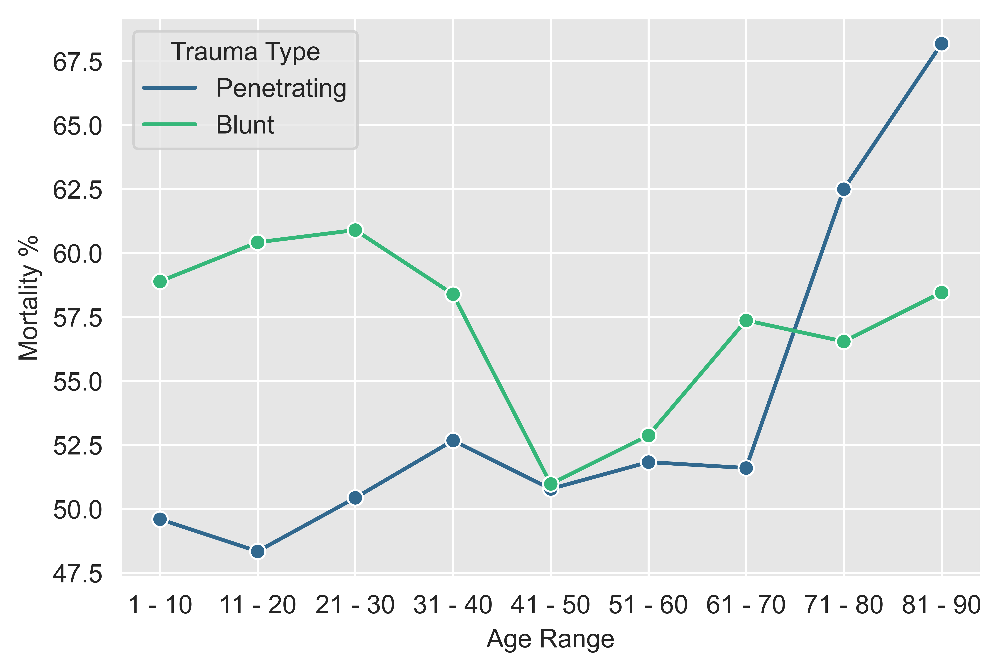

In [249]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_age_table,
               y='Mortality %',
               x='Age Range',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

> Again, we show the comparison here using the restriction on time below

In [250]:
mortality_age_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)

for age_range in age_ranges:
    if year in range(2007, 2015, 1):
        icd_filter = ICDPROCEDURE_all_df.loc[(ICDPROCEDURE_all_df['ICDPROCEDURECODE'] == 'Exploratory thoracotomy') & (ICDPROCEDURE_all_df['PROCEDUREMINS'] <=20)]
        age_range_df = TRAUMA_all_df.loc[TRAUMA_all_df['INC_KEY'].isin(np.unique(icd_filter['INC_KEY']))]
        age_range_df = age_range_df[(age_range_df['AGEYEARS'] > age_range+1) & (age_range_df['AGEYEARS'] <= age_range+10)]
    else:
        age_range_df = TRAUMA_all_df[(TRAUMA_all_df['AGEYEARS'] > age_range+1) & (TRAUMA_all_df['AGEYEARS'] <= age_range+10)]
        age_range_df = age_range_df.loc[age_range_df['HMRRHGCTRLSURGMINS'] <= 20]
    penetrating_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Penetrating'])]
    if np.shape(penetrating_df)[0] == 0:
        continue
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Blunt'])]
    if np.shape(blunt_df)[0] == 0:
        continue
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_blunt_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
    mortality_age_table = pd.concat([mortality_age_table, combined_df])
mortality_age_table['Mortality %'] = mortality_age_table['Mortality %'].astype(float)
mortality_age_table['Age Range'] = mortality_age_table['Age Range'].astype(str)
display(mortality_age_table)

,Mortality %,Trauma Type,Age Range,# of Cases
0,87.500000,Penetrating,1 - 10,40
1,84.375000,Blunt,1 - 10,32
0,85.899654,Penetrating,11 - 20,1156
1,92.936803,Blunt,11 - 20,269
0,87.076649,Penetrating,21 - 30,2244
1,91.394148,Blunt,21 - 30,581
0,88.002981,Penetrating,31 - 40,1342
1,91.101695,Blunt,31 - 40,472
0,88.473054,Penetrating,41 - 50,668
1,91.553134,Blunt,41 - 50,367


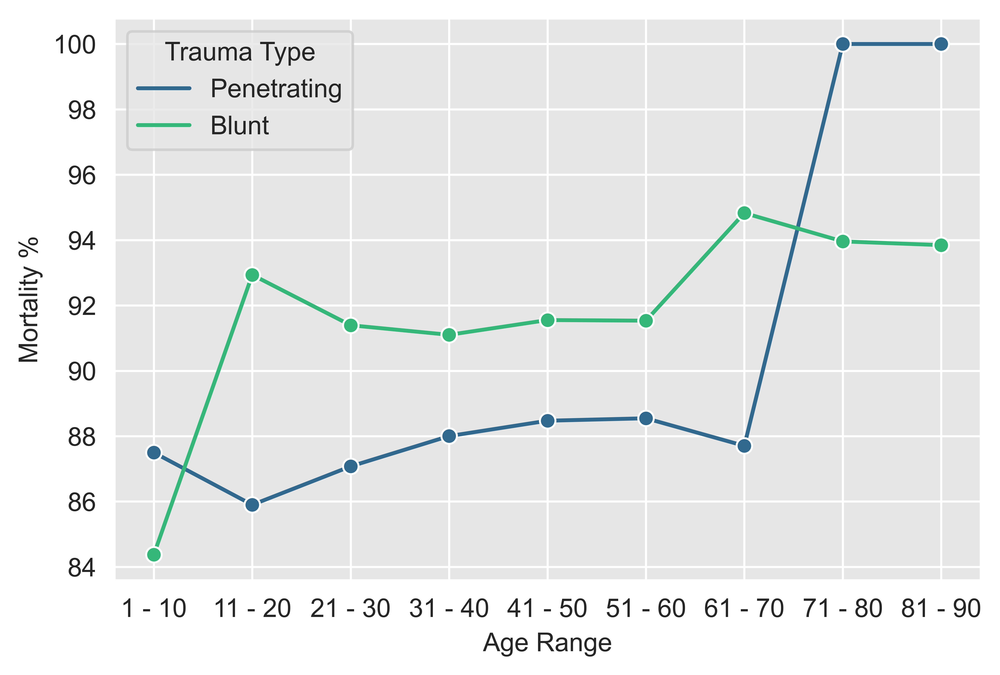

In [251]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_age_table,
               y='Mortality %',
               x='Age Range',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

## Create `DataFrame` of Mortality by `PROCEDUREMINS` and `Trauma Type`

In [153]:
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
max_time = 61
proc_times = range(0, max_time, 1)
    
for time in proc_times:
    
    if year in range(2007, 2015, 1):
        icd_filter = ICDPROCEDURE_all_df.loc[(ICDPROCEDURE_all_df['Year'] == year) & (ICDPROCEDURE_all_df['ICDPROCEDURECODE'] == 'Exploratory thoracotomy') & (ICDPROCEDURE_all_df['PROCEDUREMINS'] <=20)]
        age_range_df = TRAUMA_all_df.loc[TRAUMA_all_df['INC_KEY'].isin(np.unique(icd_filter['INC_KEY']))]
        age_range_df = age_range_df[(age_range_df['AGEYEARS'] > age_range+1) & (age_range_df['AGEYEARS'] <= age_range+10)]
    else:
        age_range_df = TRAUMA_all_df[(TRAUMA_all_df['AGEYEARS'] > age_range+1) & (TRAUMA_all_df['AGEYEARS'] <= age_range+10)]
        age_range_df = age_range_df.loc[age_range_df['HMRRHGCTRLSURGMINS'] <= 20]
    trauma_time_df = TRAUMA_all_df.loc[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] == time]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    if np.shape(penetrating_df)[0] == 0:
        continue
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    if np.shape(blunt_df)[0] == 0:
        continue
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table.head())

,Mortality %,Trauma Type,Procedure Time (Minutes after ED Arrival),# of Cases
0,95.512821,Penetrating,0,468
1,97.297297,Blunt,0,111
0,96.000000,Penetrating,1,100
1,92.105263,Blunt,1,38
0,96.815287,Penetrating,2,157


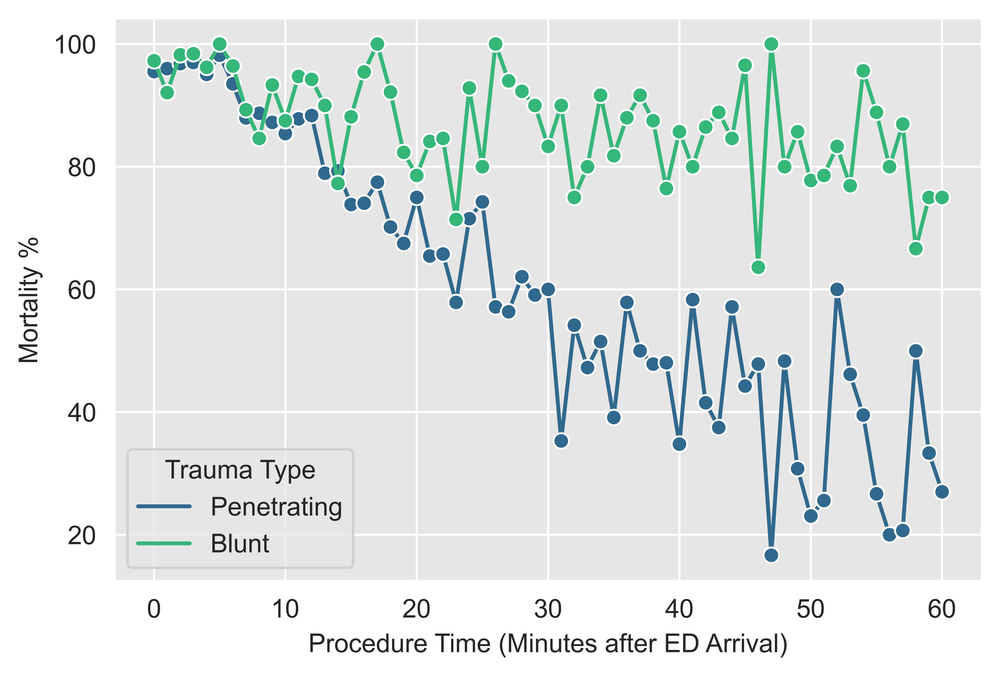

In [154]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

> Smooth out by using 5 minute intervals for average

In [155]:
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
max_time = 65
proc_times = range(0, max_time, 5)
    
for time in proc_times:
    if time == 0:
        trauma_time_df = TRAUMA_all_df[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] > time) & (TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= time+5)]
    else:
        trauma_time_df = TRAUMA_all_df[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] >= time + 1) & (TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= time+5)]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    if np.shape(penetrating_df)[0] == 0:
        continue
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    if np.shape(blunt_df)[0] == 0:
        continue
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table.head())

,Mortality %,Trauma Type,Procedure Time (Minutes after ED Arrival),# of Cases
0,96.710051,Penetrating,0,2766
1,97.688442,Blunt,0,995
0,90.280066,Penetrating,5,1214
1,94.462541,Blunt,5,614
0,80.310881,Penetrating,10,579


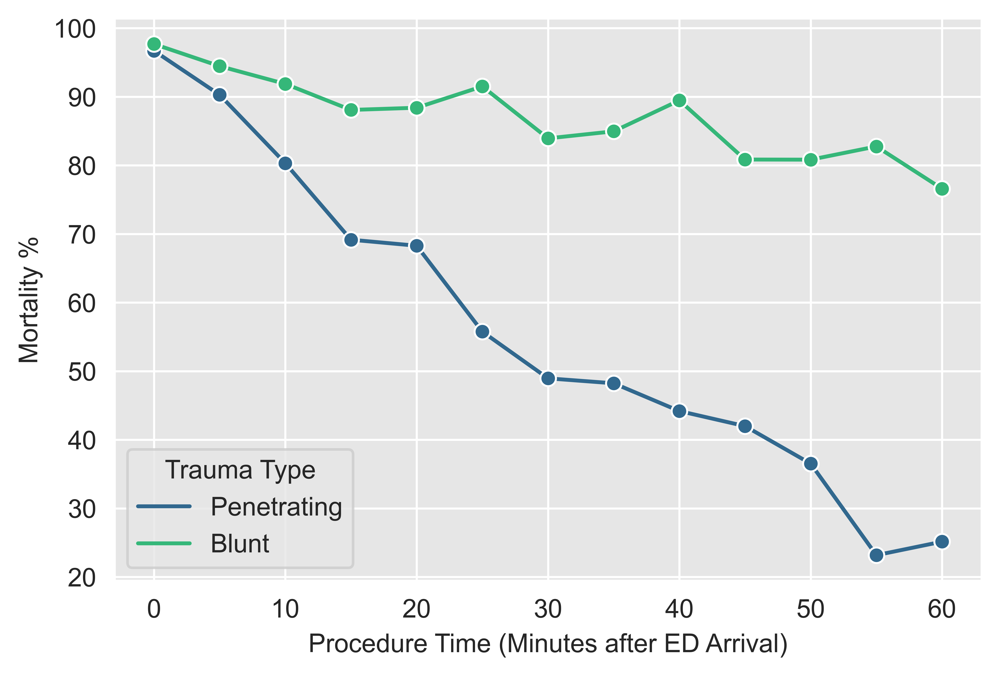

In [156]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

> Again, we show the comparison here using the restriction on time below to the initial 20 minutes after arrival

In [158]:
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
proc_times = range(0,21, 1)  
    
for time in proc_times:
    trauma_time_df = TRAUMA_all_df.loc[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] == time]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    if np.shape(penetrating_df)[0] == 0:
        continue
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    if np.shape(blunt_df)[0] == 0:
        continue
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table.head())

,Mortality %,Trauma Type,Procedure Time (Minutes after ED Arrival),# of Cases
0,95.512821,Penetrating,0,468
1,97.297297,Blunt,0,111
0,96.000000,Penetrating,1,100
1,92.105263,Blunt,1,38
0,96.815287,Penetrating,2,157


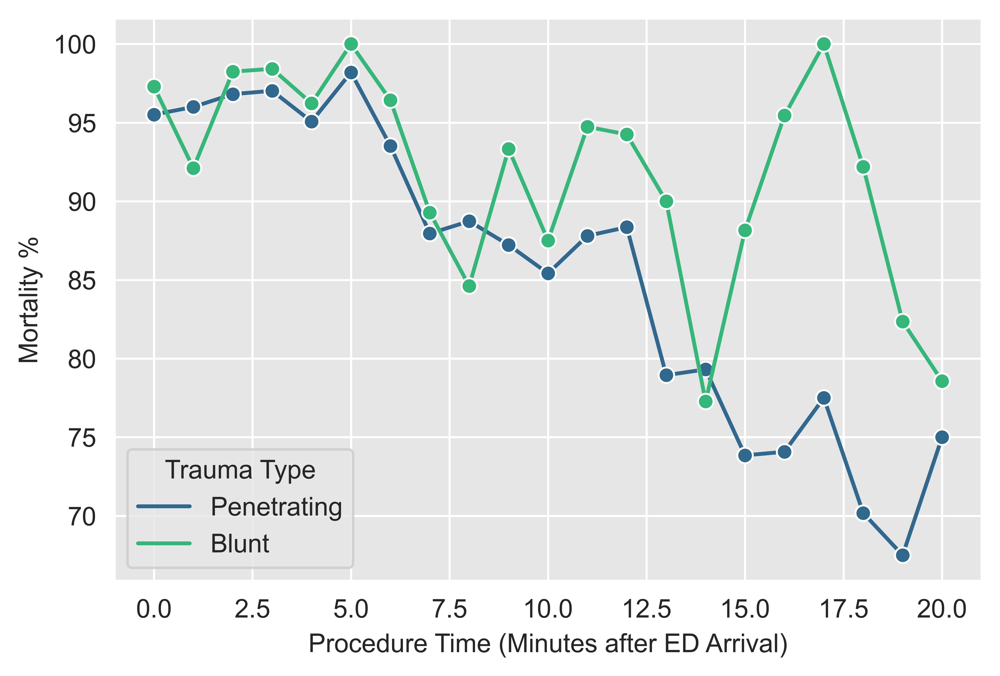

In [159]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

## Create Mortality Table for `Mechanism` and `Age Range`

In [161]:
mortality_mechanism_table = pd.DataFrame(columns=['Mortality %', 'Mechanism', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)
trauma_types = TRAUMA_all_df['MECHANISM'].unique()  # Get unique trauma types from your data

for age_range in age_ranges:
    for trauma_type in trauma_types:
        age_range_df = TRAUMA_all_df.loc[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 20]
        age_range_df = age_range_df[(age_range_df['AGEYEARS'] > age_range + 1) & (age_range_df['AGEYEARS'] <= age_range + 10)]
        trauma_type_df = age_range_df[age_range_df['MECHANISM'] == trauma_type]
        
        if np.shape(trauma_type_df)[0] == 0:
            continue
        
        expired_df1 = trauma_type_df[trauma_type_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
        expired_df2 = trauma_type_df[trauma_type_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
        
        mortality_p = ((np.shape(expired_df1)[0] + np.shape(expired_df2)[0]) / np.shape(trauma_type_df)[0]) * 100
        
        final_df = pd.DataFrame([[mortality_p, trauma_type]], columns=['Mortality %', 'Mechanism'])
        final_df['Age Range'] = '%i - %i' % (age_range + 1, age_range + 10)
        final_df['# of Cases'] = np.shape(trauma_type_df)[0]
        
        combined_df = pd.DataFrame(final_df, columns=['Mortality %', 'Mechanism', 'Age Range', '# of Cases'])
        mortality_mechanism_table = pd.concat([mortality_mechanism_table, combined_df])

mortality_mechanism_table['Mortality %'] = mortality_mechanism_table['Mortality %'].astype(float)
mortality_mechanism_table['Age Range'] = mortality_mechanism_table['Age Range'].astype(str)
mortality_mechanism_table.reset_index(drop=True, inplace=True)

display(mortality_mechanism_table.head())


,Mortality %,Mechanism,Age Range,# of Cases
0,93.750000,Firearm,1 - 10,32
1,100.000000,Cut/pierce,1 - 10,3
2,91.666667,MVT Occupant,1 - 10,12
3,100.000000,Fall,1 - 10,4
4,100.000000,Other specified and classifiable,1 - 10,2


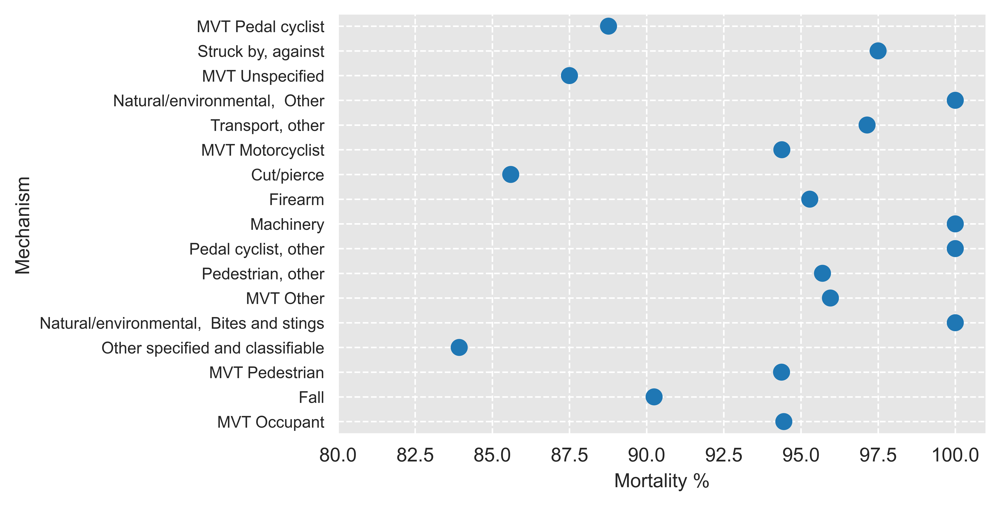

In [194]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.pointplot(data=mortality_mechanism_table,
               x='Mortality %',
               y='Mechanism', 
               ci=None,
               orient='h',
               join=False)
g.tick_params(axis='y', rotation=0, labelsize='small')
plt.grid(True, which='both', linestyle='--')
g.set_xlim(80, 101)
plt.show()